# SOM

In [1]:
# Importing the libraries
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
# Importing the dataset
# Importing the dataset
df = pd.read_csv('invest_prep_logist.csv', sep=';')
df.head(20)

,country,is_urban,age,female,married,religion,can_calc_percents,employment_type_last_year,income_government_last_year,income_own_business_last_year,...,active_bank_user,cash_property_savings,has_insurance,can_call,can_make_transaction,phone_ownership,num_financial_activities_last_year,literacy,has_investment,formal_savings (Y)
0,0,0,57,1,1,1,1,0,1,0,...,0,0,0,1,1,2,0,1,0,0
1,1,0,40,0,1,2,0,0,0,0,...,0,0,0,0,0,2,0,1,0,1
2,2,0,35,1,1,0,0,1,0,0,...,0,1,0,1,0,2,2,0,0,0
3,2,1,19,1,0,0,0,0,0,0,...,0,0,0,1,0,1,0,1,0,0
4,3,0,61,1,1,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
5,3,1,16,1,0,0,0,1,1,0,...,0,0,0,1,1,1,0,1,0,0
6,0,0,40,0,1,0,0,2,0,0,...,0,1,0,0,0,0,0,0,1,0
7,1,0,27,1,1,2,0,1,0,0,...,0,0,0,0,0,0,1,0,0,1
8,3,1,35,0,1,0,1,0,0,0,...,1,1,0,1,1,2,2,1,1,1
9,4,0,72,1,0,1,0,2,0,0,...,0,0,0,0,0,2,4,0,0,1


In [3]:
# Feature Scaling
from sklearn.preprocessing import MinMaxScaler
sc = MinMaxScaler().fit(df)
df = sc.transform(df)

In [46]:
df

array([[0.        , 0.        , 0.62686567, ..., 1.        , 0.        ,
        0.        ],
       [0.16666667, 0.        , 0.37313433, ..., 1.        , 0.        ,
        1.        ],
       [0.33333333, 0.        , 0.29850746, ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.5       , 0.        , 0.08955224, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 1.        , 0.25373134, ..., 1.        , 1.        ,
        1.        ],
       [0.5       , 0.        , 0.1641791 , ..., 1.        , 0.        ,
        0.        ]])

In [4]:
X = df[:, [0,1,2,3,4,6,9,11,12,14,15,16,18,19,20 ]]

In [5]:
#! pip install SimpSOM

In [6]:

import SimpSOM as sps
np.random.seed(605891282)
net = sps.somNet(20, 30, X, PBC=True)
net.train(0.01, 20000)
#net.save(‘filename_weights’)

Periodic Boundary Conditions active.
The weights will be initialised randomly.
Training SOM... done!


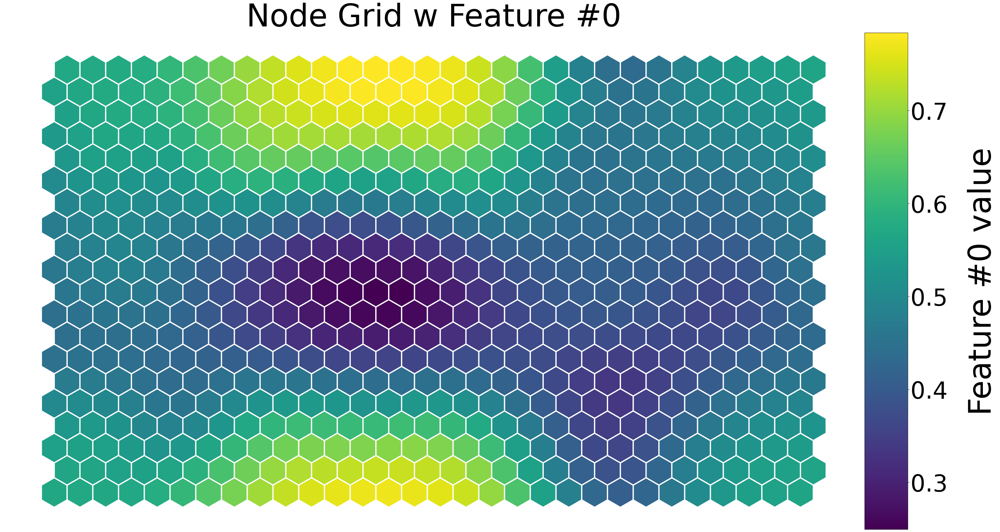

In [7]:
net.nodes_graph(colnum=0)

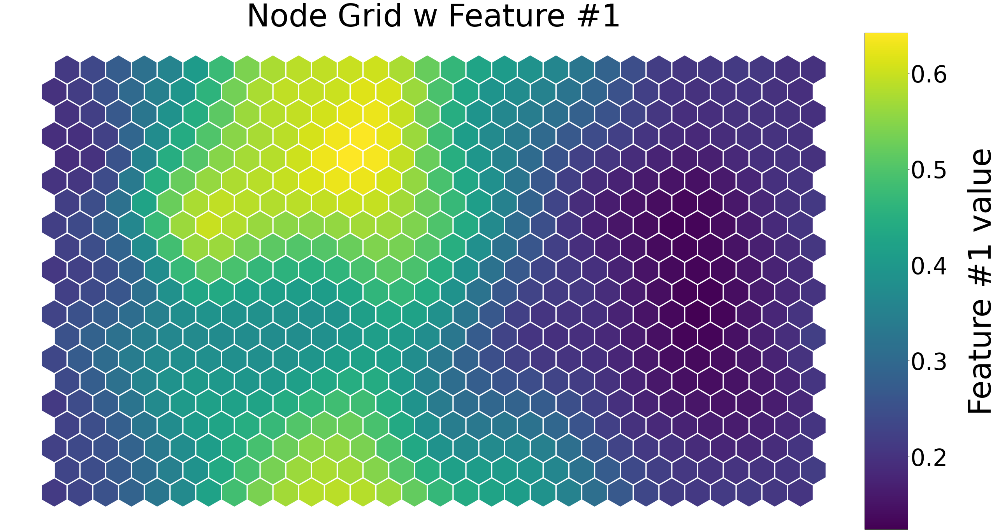

In [8]:
net.nodes_graph(colnum=1)

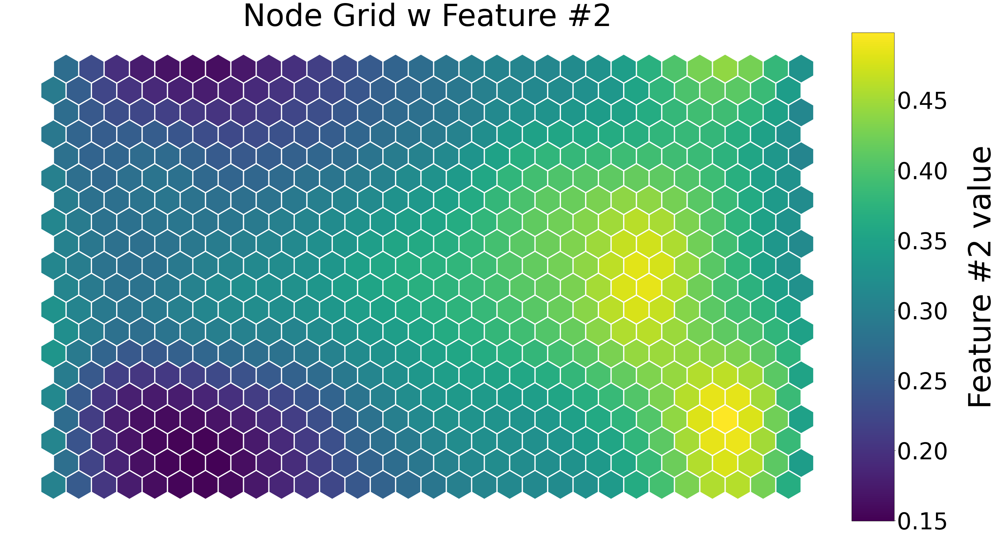

In [9]:
net.nodes_graph(colnum=2)

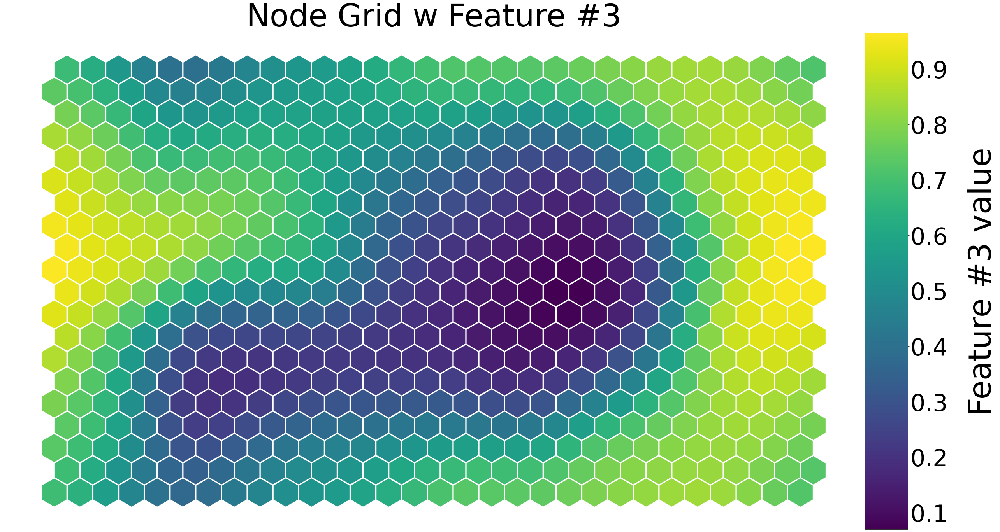

In [12]:
net.nodes_graph(colnum=3)

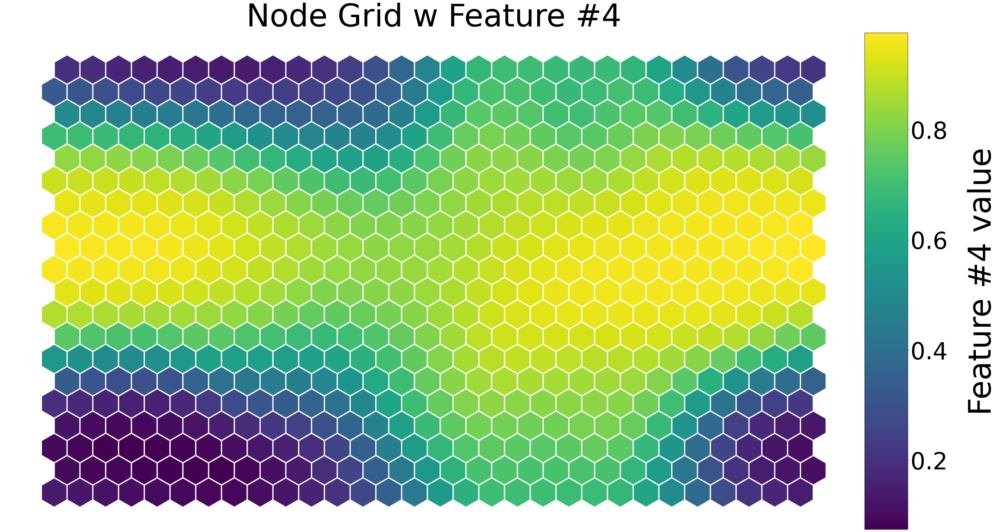

In [13]:
net.nodes_graph(colnum=4)

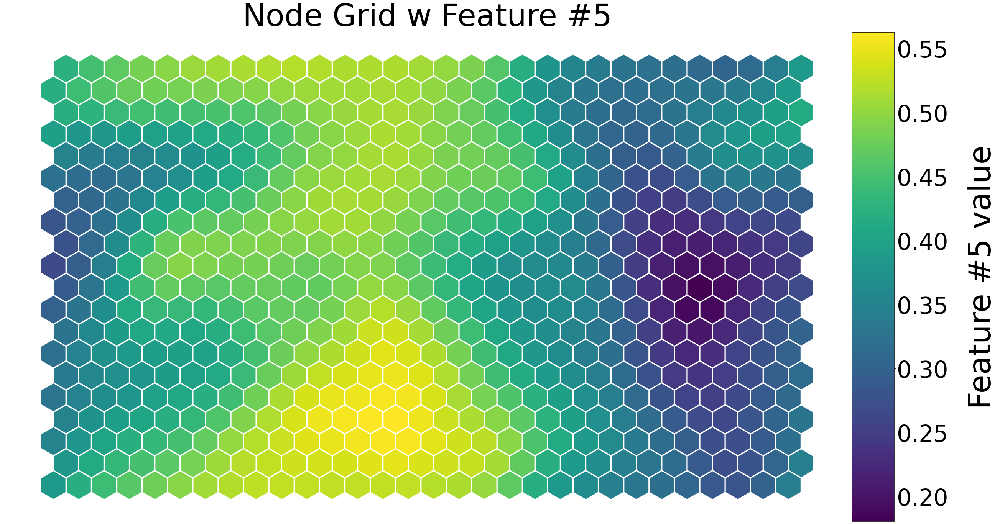

In [14]:
net.nodes_graph(colnum=5)

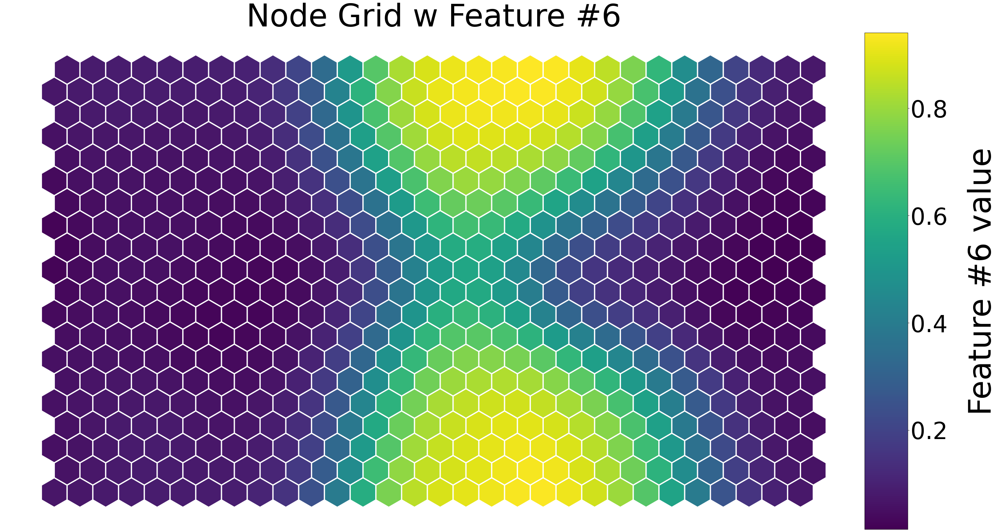

In [15]:
net.nodes_graph(colnum=6)

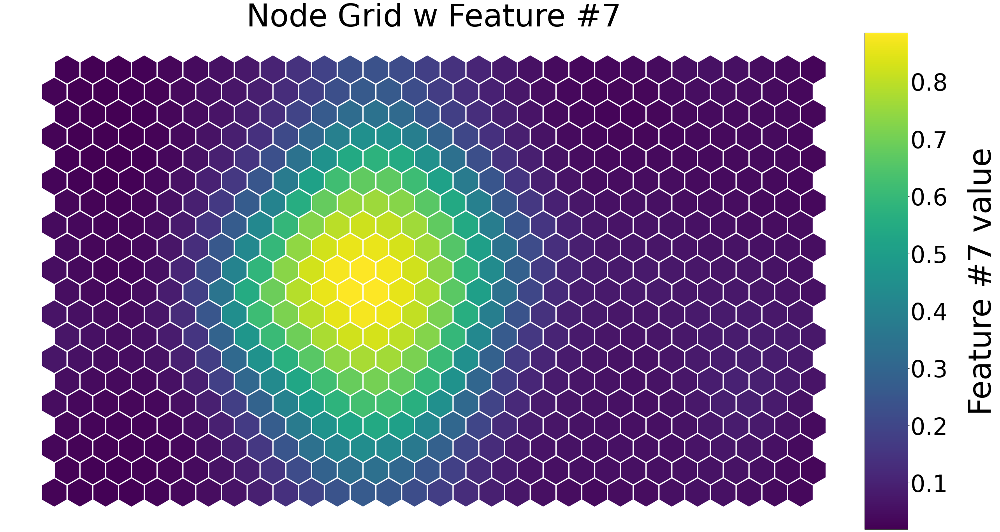

In [16]:
net.nodes_graph(colnum=7)

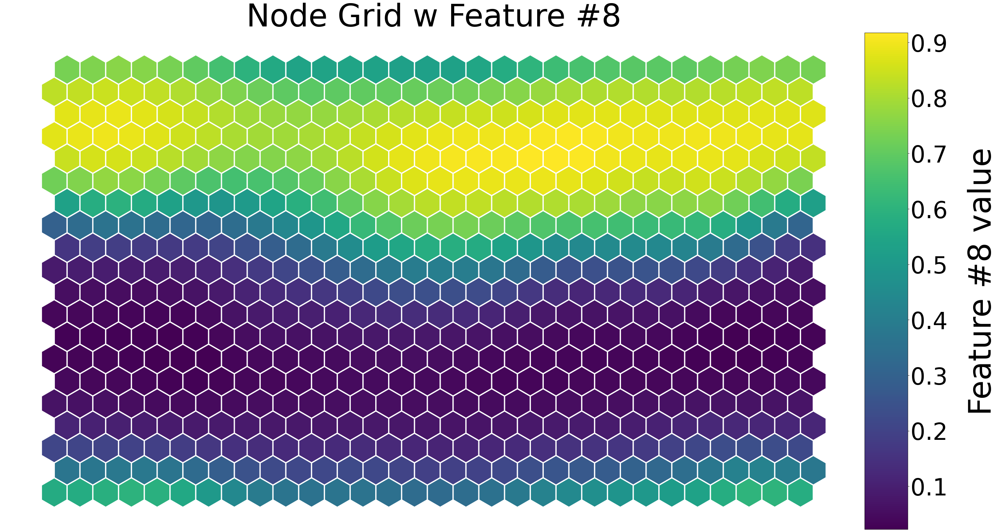

In [17]:
net.nodes_graph(colnum=8)

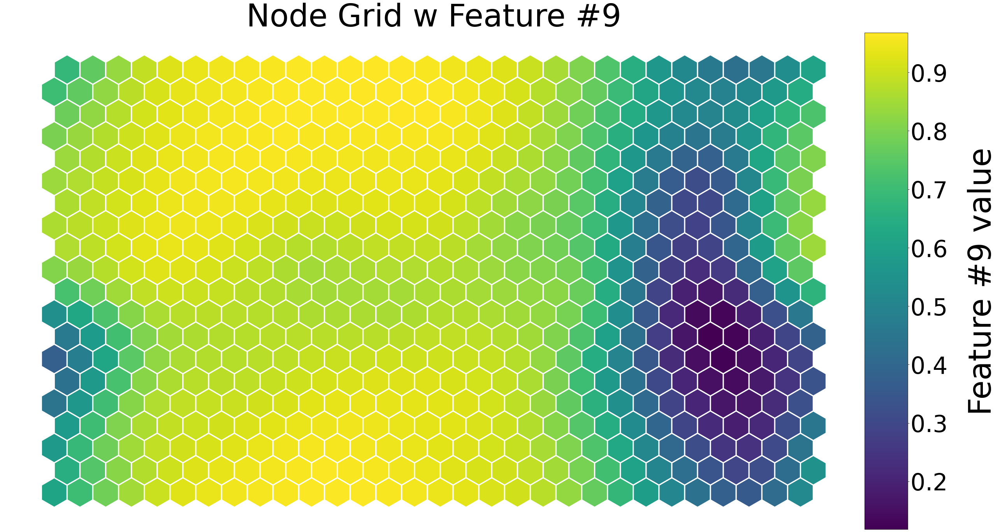

In [18]:
net.nodes_graph(colnum=9)

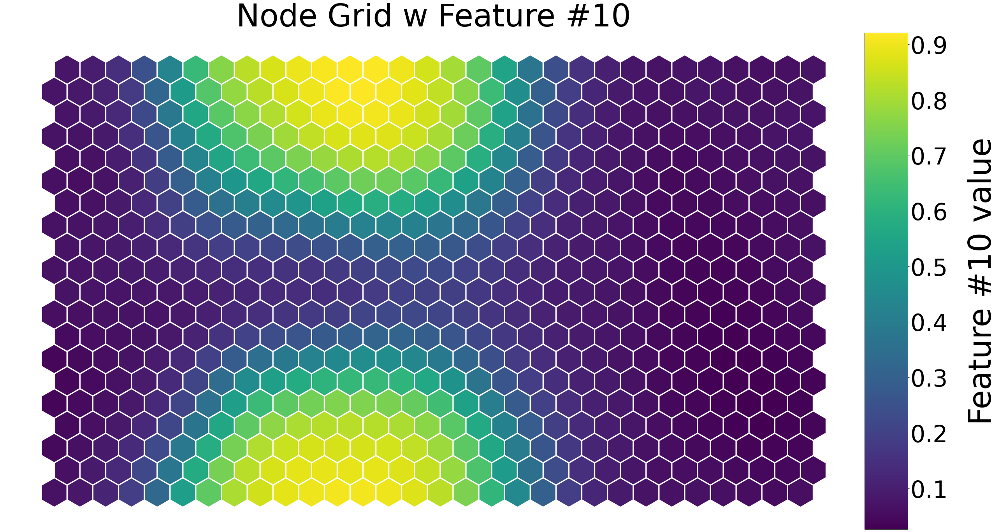

In [19]:
net.nodes_graph(colnum=10)

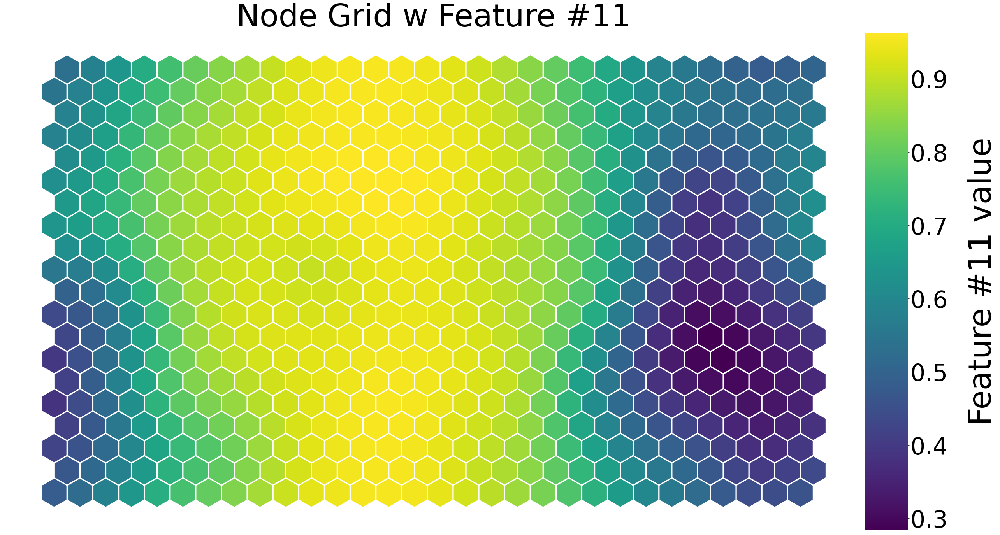

In [20]:
net.nodes_graph(colnum=11)

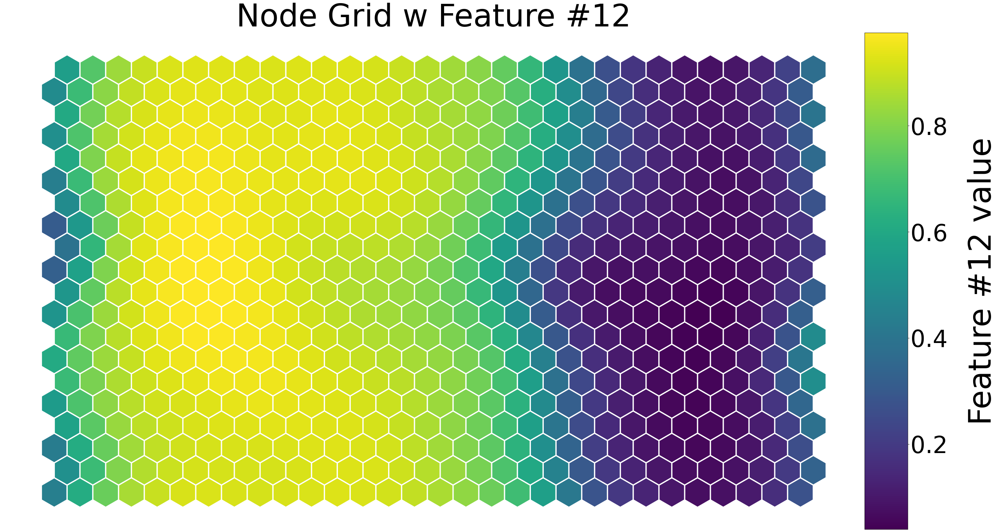

In [21]:
net.nodes_graph(colnum=12)

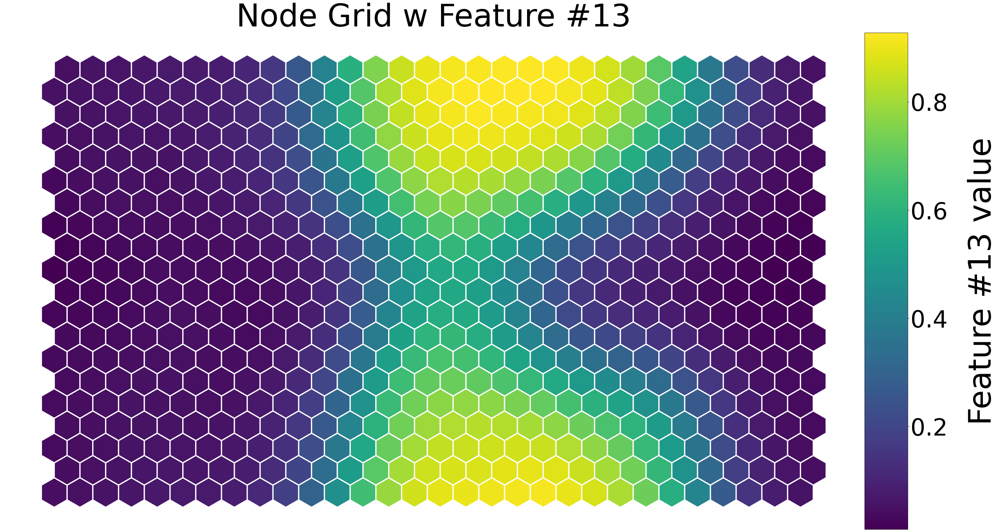

In [22]:
net.nodes_graph(colnum=13)

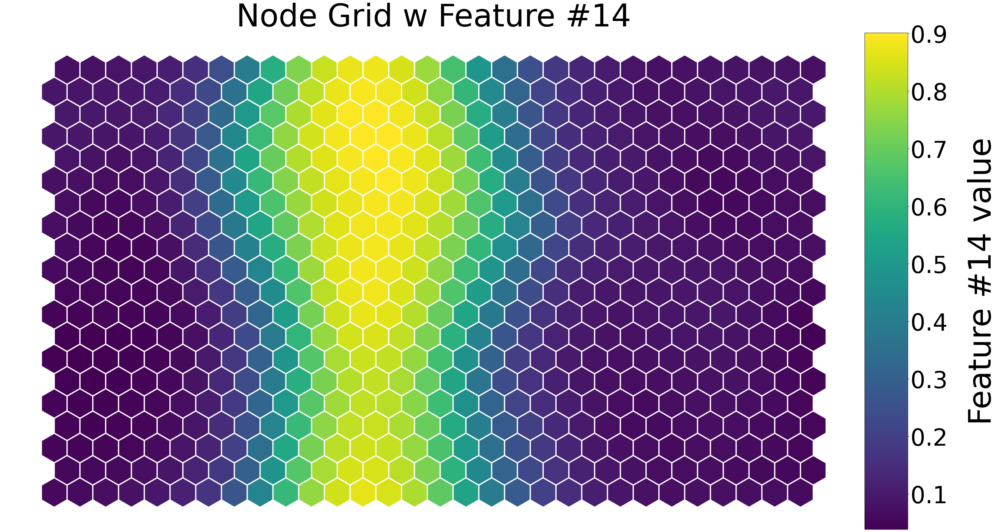

In [23]:
net.nodes_graph(colnum=14)

Таким образом, получен набор карт по каждому фактору. Чтобы понять и предположить оптимальное число кластеров попробуем исходя из последней карты (по фактору formal savings) определить сложившуюся ситуацию. Здесь мы видим, что в центре преобладают богатые люди, по бокам расположилось население со средним и низким заработком. Анализирую последующие карты прослеживается тенденция к распределению по данным классам (например в карте №2 - is urban так же в центре больше людей, которые относятся к городскому населению, по бокам люди как с сел, так и с городов - класс среднестатистического человека, а по краям карты люди из селя, что указывает на бедное население).

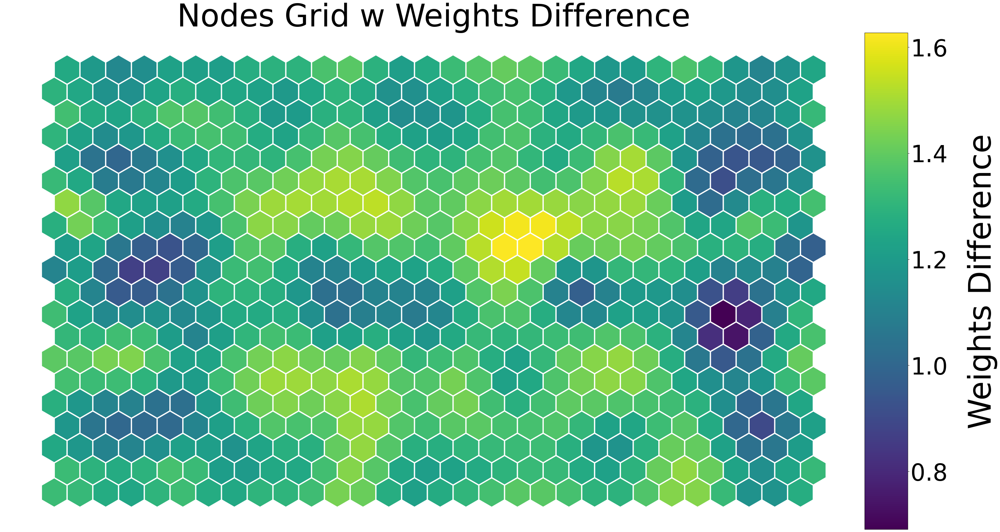

In [10]:
net.diff_graph()

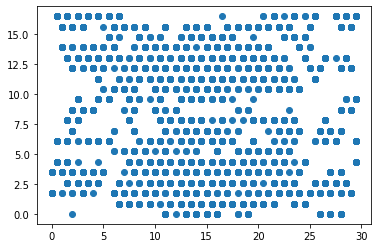

In [24]:
prj=np.array(net.project(X))
plt.scatter(prj.T[0],prj.T[1])
plt.show()

График расстояний между совокупностями обьектов не дает точных данных сколько кластеров нужно выделить. Возможно, как раз и можно выделить полученные нами 3 кластера - множество точек сверху, тонкая полоса точек по середине и множество точек снизу. Однако, учитывая предыдущие исследования принимаем решение о целесообразности 3ех кластеров.

In [25]:
# Fitting kmeans to SOM
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=0).fit(prj)

In [31]:
# Importing hc clusters
import pickle
input = open('clust-hc2.pkl', 'rb')
obj = pickle.load(input)
input.close()
hc2 = obj["hc2"]

In [32]:
# Comparing Clustering Algorithms
from sklearn.metrics.cluster import adjusted_rand_score
adjusted_rand_score(hc2,kmeans.labels_)

0.05902450677058621

In [33]:
# Importing km clusters
import pickle
input = open('clust-km2.pkl', 'rb')
obj = pickle.load(input)
input.close()
km2 = obj["km2"]

In [34]:
# Comparing Clustering Algorithms
from sklearn.metrics.cluster import adjusted_rand_score
adjusted_rand_score(km2,kmeans.labels_)

0.12132595848355225

Полученные результаты практически не совпадают с проделанными раннее методами. Возможно, при уменьшении числа кластеров % увеличится и пересечение результатов станет выше. Однако, в конечном итоге получаем модель с тремя кластерами. Осталось интерпретировать результаты.

In [54]:
X_var = df.iloc[:, [0,1,2,3,4,6,9,11,12,14,15,16,18,19,20 ]]

In [56]:
# Fitting K-Means to the dataset
km = KMeans(n_clusters = 3, init = 'k-means++', random_state = 0).fit_predict(X_var)
kms = KMeans(n_clusters = 3, random_state = 0).fit(X_var)
pd.DataFrame(kms.cluster_centers_, columns = ['country','is_urban','age','female','married','can_calc_percents','income_own_business_last_year','active_bank_user','cash_property_savings','can_call','can_make_transaction','phone_ownership','literacy','has_investment','formal_savings (Y)']).round(4)

,country,is_urban,age,female,married,can_calc_percents,income_own_business_last_year,active_bank_user,cash_property_savings,can_call,can_make_transaction,phone_ownership,literacy,has_investment,formal_savings (Y)
0,0.4005,0.1823,0.3272,0.7705,0.6751,0.2767,0.1673,0.0542,0.3523,0.4557,0.0512,0.1693,0.2620,0.1506,0.0666
1,0.0718,0.3697,0.1563,0.3356,0.7307,0.4454,0.2323,0.3259,0.2755,0.9016,0.1290,0.9181,0.7664,0.2381,0.2736
2,0.9023,0.4719,0.1273,0.5598,0.5066,0.4938,0.5504,0.2465,0.5517,0.9507,0.7801,0.8860,0.8474,0.5795,0.6502


Итак, имеем 3 класса людей: богатые (зажиточные), люди со средним заработком и бедная верста населения.
    Опишем, кто именно из людей относится к какой категории
    а) БЕДНЫЕ
   
    Country - люди, которые вероятнее проживают в первых 4 странах из списка ( 0 - Germany 1 - France 2 - Spain 3 - Great Britain)
    Is_urban - проживающие в селах (логично, что и шанс на бедность выше)
    Age - Ближе к среднему возрасту (интересное наблюдение, что поскольку выборка содержит большее число людей более пожилого возраста, то чем старше человек, тем больше шанс на его бедность, хотя казалось, что взрослые люди более состоятельные)
    female - в большинстве случаев к бедности склонны женщины
    married - скорей замужем (поскольку заработанные средства тратятся не только на себя, а делятся на семью - больше расходов и соответсвенно шанс к бедности)
    can_calc_percents, can_call, literacy, can_make transaction - все эти характеристики показывают общую грамотность и образованность человека и соответсвенно, если не уметь делать данные (в большинстве случаев элементарные) вещи, то и вероятность иметь престижную должность и высокую зп очень мала.
    income_own_business_last_year - отсутствует.
    active_bank_user - отсутствует.
    cash_property_savings - скорей отсутствует.
    phone_ownership - отсутствует даже наличие телефона, что явно указывает на низкую финансовую возможность.
    has_investment - инвестиций нет.
    formal_savings - один из главных показателей, который указывает на то, что денег хватает только на существование, сбережений нет.
    Таким образом описана категория бедных людей. Благодаря данной модели службы Соц.поддержки смогут помогать населению и бороться с нищетой.
    
    Далее опишем людей со средним зарабатком:
    Это человек, который проживеает в одной из списка первых 4 стран, вероятнее в селе молодой, мужчина, женат, иметь достаточную образованность, нет личного дела, скорей не является активным банковским участиком, нет личного жилья, которое сдается в аренду, при этом в наличии как минимум 2 телефона, нет инвестиций и вероятно, что особых денежных сбережений нет.
    
    И богатые люди: из списка последних 3 стран (4 - Poland 5 - Italy 6 - Australia), как с села, так и с города, любого пола, как одинокий, так замужем/женат, с высоким уровнем грамотности и образованности, вероятнее, что имеется частный бизнес, имеются квартиры в аренде, с 2 телефонами (это происходит, поскольку большинство людей в Европе являются владельцами айфонов, а 2 сим карты не поддерживается, поэтому нжуен второй -рабочий телефон), скорее есть инвестиции и денежные сбережения. 